<a href="https://colab.research.google.com/github/Veghit/CHESS/blob/master/Sompo_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Set Up Environment**

In [1]:
# %%script false
!pip uninstall yellowbrick -y
!pip install -U imblearn scikit-learn cache-magic dataclasses_json shap numpy pandas_profiling scipy geopandas pycountry plotly.express pyyaml==5.4.1

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import cache_magic
%cache a = 1+1
%cache -r

Creating new value for variable 'a'
Resetting entire cache


In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [7]:
import os
import sys
# sys.path.append('/content/drive/MyDrive/Sompo')
# sys.path.append('/content/drive/MyDrive/Classification')
sys.path.append('/content/drive/Shareddrives/Polaris/')

# **IMPORT DATA**

In [8]:
from utils import read_dataframe_from_sheets
sompo_claims_data = read_dataframe_from_sheets("Sompo Claims",0,"Policy_Number")


In [9]:
#@title
sompo_claims_data.head()

,Name_Of_Polocy_Holder,Address,Tel,Previous_Policy_Number,Start_Date,End_Date,Total_Premium,Date_Of_Loss,Types_Of_Loss,Total_Loss
Policy_Number,,,,,,,,,,
00M031145783,フジワラ ヒトシ,岡山県倉敷市阿知2丁目23−2,,,2015-04-05,2016-04-05,41040,2016-03-09,Fire,7972560
00M031145783,フジワラ ヒトシ,岡山県倉敷市阿知2丁目23−2,,,2015-04-05,2016-04-05,41040,2016-03-09,Fire,0
00M031496637,松村 博正,弘前市 泉野 3丁目 16−6,0172-87-6622,,2015-05-29,2020-05-29,286000,2017-06-01,Fire,385150
00M031496637,松村 博正,弘前市 泉野 3丁目 16−6,0172-87-6622,,2015-05-29,2020-05-29,286000,2017-06-01,Fire,0
00M031807470,グシケン ジユンコ,兵庫県尼崎市戸ノ内町1−1−23,,3868363486,2015-04-22,2016-04-22,4760,2016-02-29,Theft,0


In [10]:
print(f"Number of claims:{len(sompo_claims_data)}")

Number of claims:7854


In [11]:
FIRE = "Fire"
THEFT = "Theft"
FOOD_POISONING = "Food_Poisoning"
LOSSES = [FIRE,THEFT,FOOD_POISONING]

In [12]:
#@title
sompo_claims_data.Total_Loss = sompo_claims_data.Total_Loss.astype(int) 
sompo_claims_data.Total_Premium = sompo_claims_data.Total_Premium.astype(int) 
sompo_claims_data.Types_Of_Loss = sompo_claims_data.Types_Of_Loss.str.replace(" ","_")
 
sompo_policies_data = sompo_claims_data.groupby(["Policy_Number","Types_Of_Loss"]).agg(
      Total_Loss_sum=('Total_Loss', lambda x: x.sum()),
      Total_Premium=('Total_Premium', lambda x: x.max()),
      Start_Date=('Start_Date', lambda x: pd.to_datetime(x[0])),
      End_Date=('End_Date', lambda x: pd.to_datetime(x[0])),
      Name_Of_Polocy_Holder=('Name_Of_Polocy_Holder', lambda x: x[0]),
      Address=('Address', lambda x: x[0]),
      Fire=('Types_Of_Loss', lambda x: x.isin([FIRE]).any()),
      Theft=('Types_Of_Loss', lambda x: x.isin([THEFT]).any()),
      Food_Poisoning=('Types_Of_Loss', lambda x: x.isin([FOOD_POISONING]).any()),

)
import pandas as pd
# from sklearn.preprocessing import LabelEncoder


sompo_policies_data["LR"] = (1+sompo_policies_data.Total_Loss_sum)/(sompo_policies_data.Total_Premium+1)
sompo_policies_data["censoring"] = sompo_policies_data.End_Date>pd.to_datetime("2022-01-01")
sompo_policies_data["policy_progress"] = 1-(sompo_policies_data.censoring*(sompo_policies_data.End_Date-pd.to_datetime("2022-01-01"))/(sompo_policies_data.End_Date-sompo_policies_data.Start_Date))
sompo_policies_data["policy_duration"] = (sompo_policies_data.End_Date-sompo_policies_data.Start_Date-pd.Timedelta("1 d"))/pd.Timedelta("1 y")
sompo_policies_data["yearly_premium"] = (sompo_policies_data.Total_Premium/sompo_policies_data.policy_duration)

sompo_policies_data.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  exec(code_obj, self.user_global_ns, self.user_ns)


,,Total_Loss_sum,Total_Premium,Start_Date,End_Date,Name_Of_Polocy_Holder,Address,Fire,Theft,Food_Poisoning,LR,censoring,policy_progress,policy_duration,yearly_premium
Policy_Number,Types_Of_Loss,,,,,,,,,,,,,,
00M031145783,Fire,7972560,41040,2015-04-05,2016-04-05,フジワラ ヒトシ,岡山県倉敷市阿知2丁目23−2,True,False,False,194.258449,False,1.0,0.999336,41067.266301
00M031496637,Fire,385150,286000,2015-05-29,2020-05-29,松村 博正,弘前市 泉野 3丁目 16−6,True,False,False,1.346677,False,1.0,4.999418,57206.656627
00M031807470,Theft,17500,4760,2015-04-22,2016-04-22,グシケン ジユンコ,兵庫県尼崎市戸ノ内町1−1−23,False,True,False,3.675908,False,1.0,0.999336,4763.162466
00M031826924,Theft,117000,143400,2015-04-05,2016-04-05,イクヒサ,大阪府吹田市高浜町17−9,False,True,False,0.815901,False,1.0,0.999336,143495.272603
00M032062856,Theft,150000,9430,2015-05-06,2016-05-06,イマイ リユウジ,兵庫県 神戸市 灘区 摩耶海岸通 1丁目1−2−1407,False,True,False,15.905100,False,1.0,0.999336,9436.265137


/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


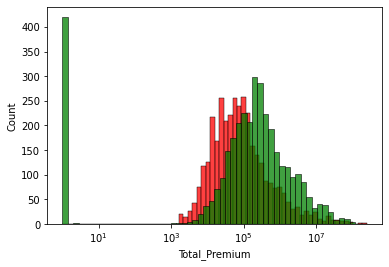

In [13]:
sns.histplot(sompo_policies_data.Total_Premium+1,log_scale=True,color="r")

sns.histplot(sompo_policies_data.Total_Loss_sum+1,log_scale=True,color="g",common_bins=True)

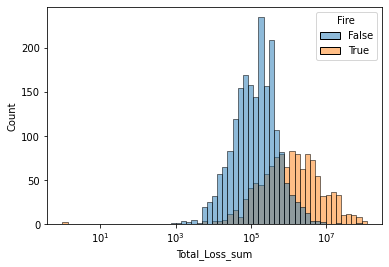

In [14]:
sns.histplot(data=sompo_policies_data[(sompo_policies_data.Total_Loss_sum > 0)],x="Total_Loss_sum",log_scale=True,color="y",hue=FIRE,common_bins=True,stat="count")


/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


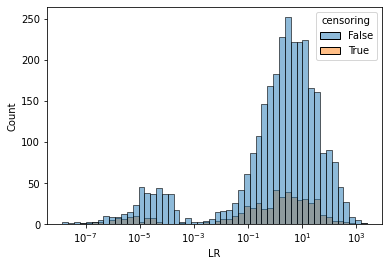

In [15]:
sns.histplot(data=sompo_policies_data,x="LR",log_scale=True,color="y",hue="censoring",common_bins=True,stat="count")


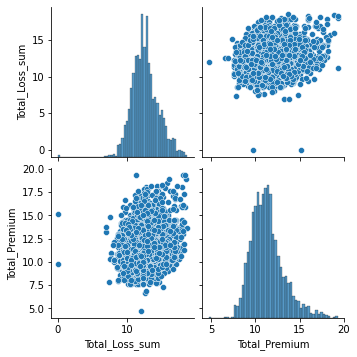

In [16]:
import numpy as np
sns.pairplot(np.log(sompo_policies_data[["Total_Loss_sum","Total_Premium"]]))

# **Adding in the insights!:**:

In [17]:
sompo_policies_data

# sompo_insights = read_dataframe_from_sheets("Sompo correlation",7,"LegalName")
sompo_insights = read_dataframe_from_sheets("Sompo_Geo_EDA",2,"Seed_LegalName")

In [18]:
# sompo_policies_data[~sompo_policies_data.Name_Of_Polocy_Holder.isin(sompo_insights.index)]

sompo_insights[~sompo_insights.index.isin(sompo_policies_data.Name_Of_Polocy_Holder)]

,external_id,Seed_PhysicalAddress,Seed_PhysicalAddressCanonized,ISN,DoingBusinessAs,LegalName,MainAddress,Perfecture,Perfecture Translate,Coordinates,,,,,,,,,,,creating_user_id,creation_date,id,InsightAdultEntertainment,InsightAllYouCanDrink,InsightAmountOfDamageRating,InsightArsonIndex,InsightBreakingandEnteringIndex,InsightBuffetJP,InsightDeepFryingJP,InsightDeliveriesByTheBusiness,InsightDeliveriesByThirdParty,InsightDistanceFromFireStations,InsightDistanceFromHospital,InsightDistanceFromPoliceStation,InsightFoodTruck,InsightGlassWindow,InsightHardLiquor,InsightHasBar,InsightHasCookedFood,InsightHasDeliveries,InsightHasGrill,InsightHasTakeOut,InsightInBusinessSinceJP,InsightIndecentassaultIndex,InsightInvasionRobberyIndex,InsightIsIzakaya,InsightJPMatchedWebsite,InsightJPPriceLevel,InsightJpCuisineTypes,InsightJpMainCuisine,InsightKaraoke,InsightMajortheftIndex,InsightMultipleLocations,InsightMurderIndex,InsightNoWebPresence,InsightNumberOfDeathsRating,InsightNumberOfDisastersInHouseholdRating,InsightNumberOfFireRating,InsightNumberOfInjuredRating,InsightNumberOfSeats,InsightOffPremiseRbntJap,InsightOutdoorSeating,InsightParking,InsightPickpocketingIndex,InsightPropertydamageIndex,InsightPursesnatchingIndex,InsightRBNTJapanWebPresenceIndex,InsightRapeIndex,InsightResidentialtargetIndex,InsightRobberyIndex,InsightSellsLiquor,InsightServeFugu,InsightServesChicken,InsightServesMeat,InsightServesRawFood,InsightServesSeafood,InsightSignBoard,InsightSmoking,InsightSocialRating,InsightTableSideCooking,InsightTatamiRoom,InsightValetParking,InsightVehicletheftIndex,InsightWebPresenceIndex,InsightWidePackageClassifier,InsightsFoodClassification,LatestOpenHour,ListOfUrls,MainPhone,MainWebsite,OpenHours,WebsiteInternalUrls,RunID
Seed_LegalName,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
,,,,DisplayNames,,,,Perfecture,Perfecture Translate,Coordinates,TheftTotalClaimsAmount,TheftTotalClaimsCount,TheftTotalPolicyDurationUntilFirstClaim,TheftTotalPolicyDurationUntilSecondClaim,FireTotalClaimsAmount,FireTotalClaimsCount,FireTotalPolicyDuration,FoodPoisoningTotalClaimsAmount,FoodPoisoningTotalClaimsCount,FoodPoisoningTotalPolicyDuration,,,,AdultEntertainment,AllYouCanDrink,AmountOfDamageRating,ArsonIndex,BreakingandEnteringIndex,Buffet,DeepFryingJP,DeliveriesByTheBusiness,DeliveriesByThirdParty,DistanceFromFireStations,DistanceFromHospital,DistanceFromPoliceStations,IsFoodTruck,glasswindow,HardLiquor,HasBar,CookedFood,Deliveries,HasGrill,HasTakeout,InBusinessSince,IndecentassaultIndex,InvasionRobberyIndex,IsIzakaya,MainWebsite,PriceLevel,cuisinetypes,Maincuisinetype,Karaoke,MajortheftIndex,MultipleLocations,MurderIndex,,NumberOfDeathsRating,NumberOfDisastersInHouseholdRating,NumberOfFireRating,NumberOfInjuredRating,NumberOfSeats,OffPremiseOperation,OutdoorSeating,Parking,PickpocketingIndex,PropertydamageIndex,PursesnatchingIndex,RBNTJapanWebPresenceIndex,RapeIndex,ResidentialtargetIndex,RobberyIndex,SellsLiquer,ServeFugu,ServesChicken,ServesMeat,ServesRawFood,Servesseafood,Signboard,Smoking,Rating,TablesideCooking,TatamiRoom,ValetParking,VehicletheftIndex,,,FoodClassification,LatestOpenHour,,,,OpeningHours,,2022_04_19_12_18_23_Sompo_Claims10_Seadra
AOK 45.00,667086765f6b4fd2a1f0717d8537fc2f,千葉県千葉市 中央区 新田町11−14,"11-14 Shindenchō, Chuo Ward, Chiba, 260-0027, ...",,,AOK 45.00,日本、〒260-0027 千葉県千葉市中央区新田町１１−１４,千葉県,Chiba prefecture,"(35.60927420000001,140.1126828)",,,,,,,,,,,planck_sompo@planckdata.com,2022-04-20T04:05:14.531Z,ea9c6a164cf741e1bb2337838686b66c,FALSE,FALSE,32084.83,0.29,10.75,FALSE,FALSE,FALSE,FALSE,0.96,0.28,0.41,FALSE,,FALSE,FALSE,TRUE,FALSE,FALSE,FALSE,,2.43,0.37,FALSE,,,,,FALSE,46.72,FALSE,0.64,TRUE,2.18,29,29.13,121.2,,FALSE,,FALSE,0.63,38.9,0.82,0,0.8,19.62,1.24,FALSE,FALSE,FALSE,FALSE,FALSE,FALSE,,FALSE,,FALSE,FALSE,FALSE,7.99,0,{},,,,,,,,


In [19]:
merged_df = sompo_insights.merge(sompo_policies_data.set_index("Name_Of_Polocy_Holder"),left_index=True,right_index=True)
merged_df = merged_df.replace("FALSE",False).replace("TRUE",True).replace("",0).astype(float,errors="ignore")
merged_df["latitude"] = merged_df.Coordinates.apply(lambda x:float(x.replace("(","").replace(")","").split(",")[0]))
merged_df["longitude"] = merged_df.Coordinates.apply(lambda x:float(x.replace("(","").replace(")","").split(",")[1]))
merged_df["InsightInBusinessSinceJP"] = merged_df.InsightInBusinessSinceJP>0
merged_df = merged_df.join(pd.get_dummies(merged_df["Perfecture Translate"]))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46]),
 <a list of 47 Text major ticklabel objects>)

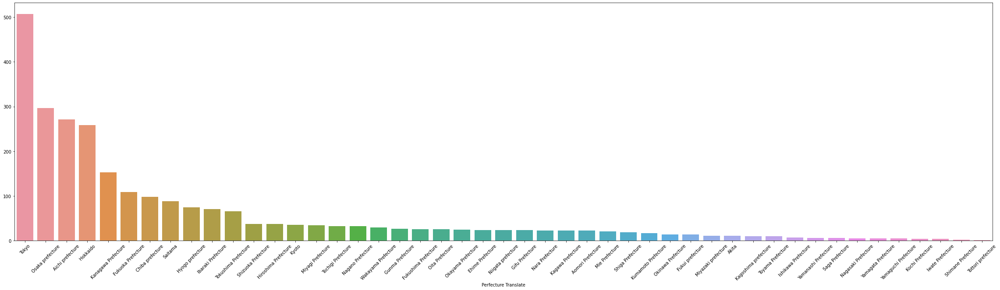

In [20]:
%matplotlib inline
plt.figure(figsize=(40, 10)) 

cnt = pd.DataFrame(data=merged_df.groupby("Perfecture Translate").size().sort_values(ascending=False)[:]).T

sns.barplot(data = cnt)
plt.xticks(rotation = 45)

In [21]:
merged_df.to_csv("sompo_policies_with_insights.csv")
merged_df.head()


,external_id,Seed_PhysicalAddress,Seed_PhysicalAddressCanonized,ISN,DoingBusinessAs,LegalName,MainAddress,Perfecture,Perfecture Translate,Coordinates,,,,,,,,,,,creating_user_id,creation_date,id,InsightAdultEntertainment,InsightAllYouCanDrink,InsightAmountOfDamageRating,InsightArsonIndex,InsightBreakingandEnteringIndex,InsightBuffetJP,InsightDeepFryingJP,InsightDeliveriesByTheBusiness,InsightDeliveriesByThirdParty,InsightDistanceFromFireStations,InsightDistanceFromHospital,InsightDistanceFromPoliceStation,InsightFoodTruck,InsightGlassWindow,InsightHardLiquor,InsightHasBar,InsightHasCookedFood,InsightHasDeliveries,InsightHasGrill,InsightHasTakeOut,InsightInBusinessSinceJP,InsightIndecentassaultIndex,InsightInvasionRobberyIndex,InsightIsIzakaya,InsightJPMatchedWebsite,InsightJPPriceLevel,InsightJpCuisineTypes,InsightJpMainCuisine,InsightKaraoke,InsightMajortheftIndex,InsightMultipleLocations,InsightMurderIndex,InsightNoWebPresence,InsightNumberOfDeathsRating,InsightNumberOfDisastersInHouseholdRating,InsightNumberOfFireRating,InsightNumberOfInjuredRating,InsightNumberOfSeats,InsightOffPremiseRbntJap,InsightOutdoorSeating,InsightParking,InsightPickpocketingIndex,InsightPropertydamageIndex,InsightPursesnatchingIndex,InsightRBNTJapanWebPresenceIndex,InsightRapeIndex,InsightResidentialtargetIndex,InsightRobberyIndex,InsightSellsLiquor,InsightServeFugu,InsightServesChicken,InsightServesMeat,InsightServesRawFood,InsightServesSeafood,InsightSignBoard,InsightSmoking,InsightSocialRating,InsightTableSideCooking,InsightTatamiRoom,InsightValetParking,InsightVehicletheftIndex,InsightWebPresenceIndex,InsightWidePackageClassifier,InsightsFoodClassification,LatestOpenHour,ListOfUrls,MainPhone,MainWebsite,OpenHours,WebsiteInternalUrls,RunID,Total_Loss_sum,Total_Premium,Start_Date,End_Date,Address,Fire,Theft,Food_Poisoning,LR,censoring,policy_progress,policy_duration,yearly_premium,latitude,longitude,Aichi prefecture,Akita,Aomori Prefecture,Chiba prefecture,Ehime Prefecture,Fukui prefecture,Fukuoka Prefecture,Fukushima Prefecture,Gifu Prefecture,Gunma Prefecture,Hiroshima Prefecture,Hokkaido,Hyogo prefecture,Ibaraki Prefecture,Ishikawa Prefecture,Iwate Prefecture,Kagawa Prefecture,Kagoshima prefecture,Kanagawa Prefecture,Kochi Prefecture,Kumamoto Prefecture,Kyoto,Mie Prefecture,Miyagi Prefecture,Miyazaki prefecture,Nagano Prefecture,Nagasaki Prefecture,Nara Prefecture,Niigata prefecture,Oita Prefecture,Okayama Prefecture,Okinawa Prefecture,Osaka prefecture,Saga Prefecture,Saitama,Shiga Prefecture,Shimane Prefecture,Shizuoka Prefecture,Tochigi Prefecture,Tokushima Prefecture,Tokyo,Tottori prefecture,Toyama Prefecture,Wakayama Prefecture,Yamagata Prefecture,Yamaguchi Prefecture,Yamanashi Prefecture
(有) 佐伯,29d878c4329a4be79b8a547a03b0d75b,愛媛県 松山市 湊町5‐4‐4,"Japan, 〒790-0012 Ehime, Matsuyama, Minatomachi...",0.0,漱石,(有) 佐伯,日本、〒790-0012 愛媛県松山市湊町５丁目４−４,愛媛県,Ehime Prefecture,"(33.8364288,132.7625607)",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,planck_sompo@planckdata.com,2022-04-19T12:29:30.555Z,9982ca70e0ac47f09e1f6859b58c58b2,0.0,0.0,39525.22,0.14,3.39,0.0,1.0,0.0,0.0,0.35,0.59,0.16,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,False,1.01,0.00,0.0,0,¥,"izakaya, japanese",japanese,0.0,29.08,0.0,0.43,0.0,2.58,7.49,27.90,21.83,0,0.0,0.0,0.0,0.22,47.99,0.43,2.50,0.51,14.43,0.07,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,3.3,1.0,0.0,0.0,0.58,0.67,"rbnt, retail, food_beverage_manufacturing",restaurant,9:00 PM,https://tabelog.com/ehime/A3801/A380101/380044...,8.189946e+10,0,"Sunday: 11:30AM-3PM, 6PM-9PM; Monday: 11:30AM-...",0,0.0,5165218.0,186000.0,2018-09-07,2023-09-07,愛媛県 松山市 湊町5‐4‐4,1.0,0.0,0.0,27.769845,1.0,0.663746,4.996680,37224.715068,33.836429,132.762561,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
(有)ジンフードサービス,dc1618db8aaf466da446f1f06f7f2c51,稲沢市天池光田町94−3,"94-3 Amaikekōdachō, Inazawa, Aichi 492-8274, J...",0.0,0,(有)ジンフードサービス,日本、〒492-8274 愛知県稲沢市天池光田町９４−３,愛知県,Aichi prefecture,"(35.2529537,136.7737168)",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

In [22]:
def create_dataset(df,filter):
  clean_subset = df[filter]
  y_fire = (clean_subset.Total_Premium-clean_subset.Total_Loss_sum).rank(pct=True)
  # y_fire[y_fire<=0]=0
  clean_subset.InsightJPPriceLevel = clean_subset.InsightJPPriceLevel.str.len()
  # clean_subset.Total_Premium=clean_subset.Total_Premium/(clean_subset.policy_duration/366)
  X_fire = clean_subset.drop(columns=["MainPhone","Tel","Start_Date","End_Date","Date_Of_Loss","Address","Total_Loss","Total_Premium",
                            "external_id","ISN","DoingBusinessAs","MainAddress","","policy_duration","InsightNumberOfDeathsRating",
                            "WebsiteInternalUrls","Previous_Policy_Number","OpenHours","LatestOpenHours","Policy_Number","Rep Name","LatestOpenHour","yearly_premium",
                            "Prefecture","Prefecture","creation_date","id","creating_user_id","ListOfUrls","MainWebsite","LatestOpenHour","InsightWidePackageClassifier",
                            "InsightsFoodClassification","InsightJPMatchedWebsite","Total_Loss_sum","LR","InsightJpCuisineTypes","InsightJpMainCuisine","InsightNumberOfSeats"],errors="ignore")

  X_fire = X_fire.fillna(-100).select_dtypes(include=["int",'float',"bool","uint8"])
  return X_fire,y_fire.fillna(-100)



***Binary Insights filter***

0 0
0 1
0 2
0 3
0 4
0 5
1 0
1 1
1 2
1 3
1 4
1 5
2 0
2 1
2 2
2 3
2 4
2 5
3 0
3 1
3 2
3 3
3 4
3 5
4 0
4 1
4 2
4 3
4 4
4 5


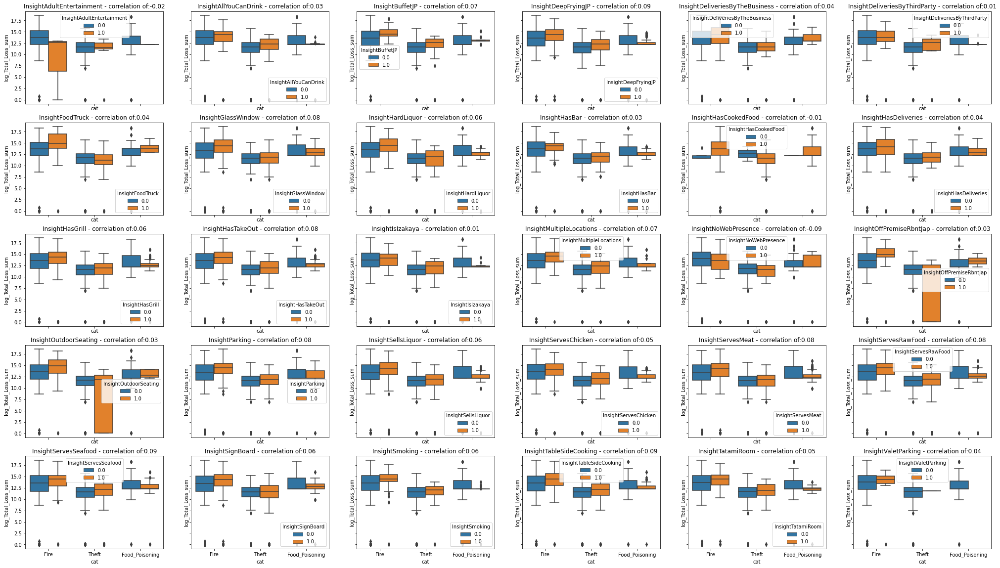

In [23]:
i=0  
fig, axs = plt.subplots(nrows=5, ncols=6,figsize=(35, 20),sharex=True,sharey=True)
merged_df_for_binary_plot = merged_df.copy()
for col in merged_df_for_binary_plot.select_dtypes("float").columns:
  if  ("Insight" not in col) or (len(col)<2) or (merged_df_for_binary_plot[col].mean()==0) or (merged_df_for_binary_plot[col].max()>1) or (len(merged_df_for_binary_plot[col].unique())>5) or (merged_df_for_binary_plot[col].sum()<10):
    continue

  merged_df_for_binary_plot["cat"] = merged_df_for_binary_plot.apply(lambda x:"Fire" if x["Fire"]>0 else "" + "Theft" if x["Theft"]>0 else "" +FOOD_POISONING if x[FOOD_POISONING]>0 else "",axis=1)
  merged_df_for_binary_plot["log_Total_Loss_sum"] = np.log(merged_df_for_binary_plot["Total_Loss_sum"]+1)
  corr = np.corrcoef(merged_df_for_binary_plot["log_Total_Loss_sum"],merged_df_for_binary_plot[col])[0][1]
  row_index,col_index = i//6 , i%6
  print(row_index,col_index)
  ax = sns.boxplot(ax=axs[row_index][col_index],x="cat", y="log_Total_Loss_sum", hue=col, data=merged_df_for_binary_plot)#,estimator=np.median)
  ax.set_title(f"{col} - correlation of:{corr:.2f}")
  # plt.show()
  i+=1


In [24]:
import plotly.express as px
fig = px.scatter_mapbox(merged_df[merged_df["Total_Premium"]>=0], lat="latitude", lon="longitude", color =  "InsightDistanceFromFireStations", size = "Total_Loss_sum", size_max = 20,
                        color_continuous_scale="bluered",                    )
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

/usr/local/lib/python3.7/dist-packages/distributed/config.py:20: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  defaults = yaml.load(f)


In [25]:
JPY_USD = 128 # grossomodo
MAX_PREMIUM = 1e5*JPY_USD
X_fire,y_fire = create_dataset(merged_df,filter = ((merged_df.Fire>0) & (merged_df.censoring==0) & (merged_df.InsightNoWebPresence==0)& (merged_df.yearly_premium<MAX_PREMIUM)))
X_theft,y_theft = create_dataset(merged_df,filter = ((merged_df.Theft>0) & (merged_df.censoring==0) & (merged_df.InsightNoWebPresence==0)& (merged_df.yearly_premium<MAX_PREMIUM)))
X_Food_Poisoning,y_Food_Poisoning = create_dataset(merged_df,filter = ((merged_df.Food_Poisoning>0) & (merged_df.censoring==0) & (merged_df.InsightNoWebPresence==0)& (merged_df.yearly_premium<MAX_PREMIUM)))
print(f"X_fire:{X_fire.shape}")
print(f"X_theft:{X_theft.shape}")
print(f"X_Food_Poisoning:{X_Food_Poisoning.shape}")

X_fire:(519, 112)
X_theft:(681, 112)
X_Food_Poisoning:(87, 112)


/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
#@title
# only_rbnt = merged_df [merged_df.InsightNoWebPresence=="FALSE"]



# X = only_rbnt.drop(columns=["MainPhone","Tel","Start_Date","End_Date","Date_Of_Loss","Address","Total_Loss",
#                             "Total_Premium","WebsiteInternalUrls","Previous_Policy_Number","OpenHours","LatestOpenHours","Policy_Number","Rep Name","LatestOpenHour"],errors="ignore")
# for col in X.columns:


#   if col in ["FoodClassification","LatestOpenHour","Maincuisinetype","NumberOfSeats","OpenHours","PriceLevel","cuisinetypes"]:
#     continue


#   X.loc[:,col]= (X.loc[:,col].replace("FALSE",0).replace("TRUE",1).replace('',0))

#   X.loc[:,col] = X.loc[:,col].astype(float,errors="ignore")
#   if (str(X.loc[:,col].dtype)=="object") and (len(X.loc[:,col].unique())>10):
#     X = X.drop(columns=[col])
#   else:
#     pass
# # X = X.astyp÷÷e(float)
# X = pd.get_dummies(X)
# X.describe()
# print(list(X.columns))

In [27]:
# for col in X.columns:
#   for risk in y.unique():
#     clf = X.loc[:,col]>(X.loc[:,col].mean())
#     goal = y==risk
#     tp = (goal&clf).sum()
#     tn = ((~goal)&(~clf)).sum()
#     fp = (clf&(~goal)).sum()
#     fn = ((~clf)&(goal)).sum()    
#     ppv = tp/(tp+fp)
#     npv = tn/(tn+fn)
#     if tp>20 and ppv>0.6:
#       print(f"risk:{risk} col:{col} PPV:{ppv} tp:{tp} fp:{fp}")
#     # if tn>20 and npv>0.6:
#     #   print(f"risk:{risk} col:{col} NPV:{npv} tn:{tn} fn:{fn}")

In [28]:
def plot_reg_tree(X,y):
  from sklearn import tree
  import graphviz 
  
  tree_reg_fire = tree.DecisionTreeRegressor(max_depth=3)
  tree_reg_fire.fit(X,y)

  dot_data = tree.export_graphviz(tree_reg_fire, out_file=None, 
                      feature_names=X_fire.columns,proportion=True,
                      filled=True, rounded=True,  
                      special_characters=True)  
  graph = graphviz.Source(dot_data)  
  return graph

# **FIRE**

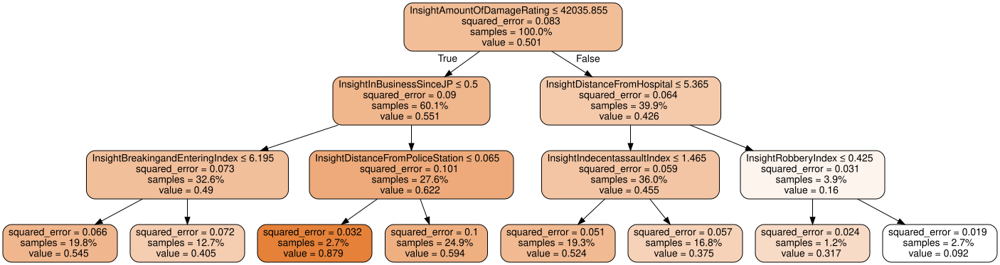

In [29]:
plot_reg_tree(X_fire,y_fire)

# **Theft**

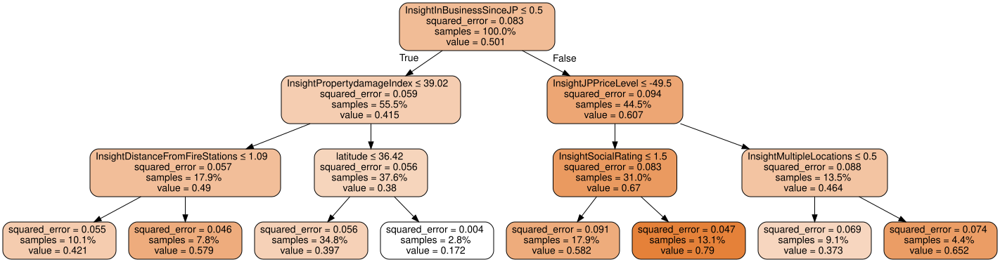

In [30]:
plot_reg_tree(X_theft,y_theft)

# Food Poisoning

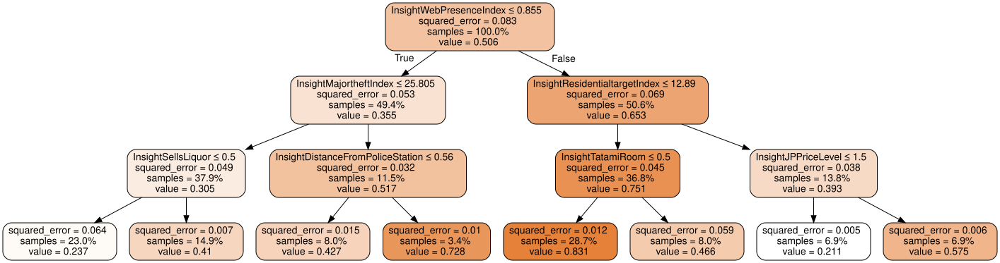

In [31]:
plot_reg_tree(X_Food_Poisoning,y_Food_Poisoning)

# ***Get out the big guns***

In [32]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,RandomForestRegressor


feature_names = [i for i in merged_df.columns]
x = merged_df.select_dtypes(["float"])
y=x["Total_Loss_sum"]>x["Total_Premium"]
x=x.drop(columns=["Total_Loss_sum","LR"])
classes = ["LOSS","PROFIT"]
train_X, val_X, train_y, val_y = train_test_split(x, y, random_state=1)
my_model = RandomForestClassifier(random_state=0,n_estimators=100).fit(train_X, train_y)

In [48]:
%matplotlib inline
import matplotlib.pyplot as plt
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(my_model)

# calculate shap values. This is what we will plot.
# Calculate shap_values for all of val_X rather than a single row, to have more data for plot.
data_to_plot = x[:]
shap_values = explainer.shap_values(data_to_plot)

# **Which features are important to predict losses?**

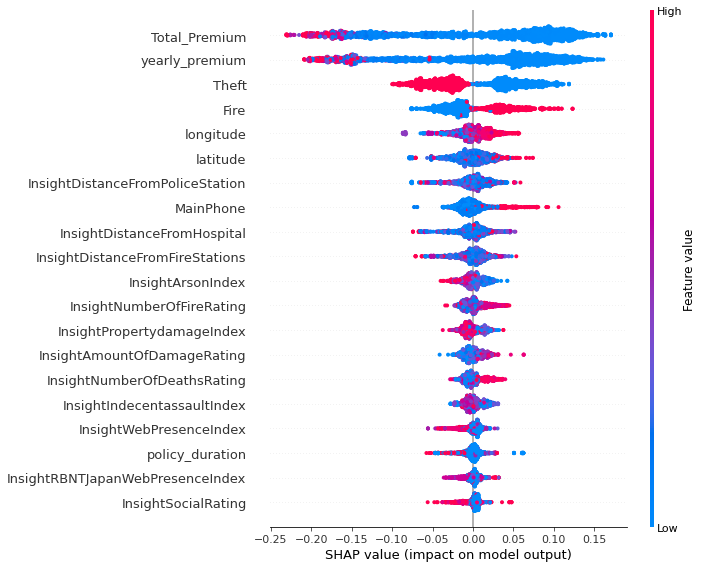

In [49]:
# Make plot. Index of [1] is explained in text below.
shap.summary_plot(shap_values[1], data_to_plot)

In [50]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1],feature_names=x.columns,features=x)

0.8393487551096247

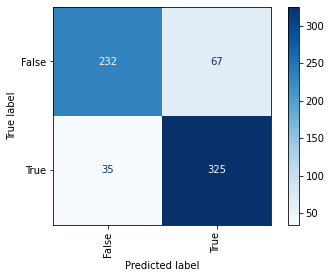

In [51]:
from sklearn.metrics import plot_confusion_matrix,accuracy_score,balanced_accuracy_score,ConfusionMatrixDisplay
disp = ConfusionMatrixDisplay.from_estimator(my_model, val_X, val_y, display_labels=sorted(y.unique()), cmap=plt.cm.Blues, xticks_rotation='vertical')
balanced_accuracy_score(val_y,my_model.predict(val_X))